<h1>Multifile LDA -- Beer Analysis</h1>

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import pylab as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display, HTML

from multifile_lda import MultifileLDA
from multifile_viz import MultifileLDAViz
sns.set_style("whitegrid", {'axes.grid' : False})

The following text-mining terminologies will be used throughout this notebook to refer to the objects of interest:

|Text-mining|Metabolomics                   |
|-----------|-------------------------------|
|Word       |Discretised fragment/loss value|
|Document   |Fragmentation spectrum         |
|Collection |Sample                         |
|Topic      |Mass2Motif                     |

In this notebook, we aplies the multi-file LDA to the analysis of 4 Beer samples. The multi-file LDA model is a simple extension that we did to the Standard LDA model. In this model, each collection still has its own document-to-topic distributions, but the topic-to-word distributions are globally shared across collections. 

In the previous workflow (of the draft manuscript), we ran LDA independently for each sample then by eyes, we had to match the topics across samples. 

In this model, since the same topic is used across samples, we don't have to do the step of matching topics across collections anymore. Also, each topic's abundance across all the collections can easily be compared now -- where 'abundance' of a topic refers to the number of documents in a collection that can be explained by a topic at above a certain set threshold on the document-to-topic distribution. Additionally, if MS1 data is available, we can also compare the topic's differential expression across samples, using e.g. PLAGE.

To begin the analysis, run either step 1a or 1b below:
- The input to step 1a is the dataframe of MS1 and MS2 peaks, after loading the .mzXML files, running peak detection and linking the MS1 to MS2 peaks in R.
- The input to step 1b is the results from running LDA analysis in step 1a.

<h2>1a. Extract features and run LDA</h2>

Create a new multifile LDA object and load the MS1 and MS2 input files for beer1, 2, 3 and QC.

In [2]:
input_set = [
    ('input/Beer1pos_MS1filter_Method3_ms1.csv', 'input/Beer1pos_MS1filter_Method3_ms2.csv'),
    ('input/Beer2pos_MS1filter_Method3_ms1.csv', 'input/Beer2pos_MS1filter_Method3_ms2.csv'),
    ('input/Beer3pos_MS1filter_Method3_ms1.csv', 'input/Beer3pos_MS1filter_Method3_ms2.csv'),
    ('input/BeerQCpos_MS1filter_Method3_ms1.csv','input/BeerQCpos_MS1filter_Method3_ms2.csv'),
]

Extract word (fragment/loss) features from these MS1 and MS2 tables. Previously this was done in R, now it's in Python.

Then normalise the data the same way as in the single-file version: within each fragmentation spectrum, we divide the MS2 intensities by the max MS2 intensity in the same spectrum and multiplying by *scaling_factor*. Essentially this turns the intensity of an MS2 peak into the number of word features in the document.

In [3]:
lda = MultifileLDA()

scaling_factor=10           # previously set to 100 in the single file LDA 
fragment_grouping_tol=7     # grouping tolerance in ppm for the fragment
loss_grouping_tol=12        # grouping tolerance in ppm for the neutral loss
loss_threshold_min_count=15 # min. counts of loss values to occur
loss_threshold_max_val=200  # max. loss values

lda.load_all(input_set, scaling_factor, fragment_grouping_tol, loss_grouping_tol,
            loss_threshold_min_count, loss_threshold_max_val)

Loading input/Beer1pos_MS1filter_Method3_ms1.csv
Loading input/Beer1pos_MS1filter_Method3_ms2.csv
Loading input/Beer2pos_MS1filter_Method3_ms1.csv
Loading input/Beer2pos_MS1filter_Method3_ms2.csv
Loading input/Beer3pos_MS1filter_Method3_ms1.csv
Loading input/Beer3pos_MS1filter_Method3_ms2.csv
Loading input/BeerQCpos_MS1filter_Method3_ms1.csv
Loading input/BeerQCpos_MS1filter_Method3_ms2.csv
Processing fragments for file 0
Processing fragments for file 1
Processing fragments for file 2
Processing fragments for file 3
Total groups=6249
Processing losses for file 0
Processing losses for file 1
Processing losses for file 2
Processing losses for file 3
Total groups=31
Populating dataframe for fragment group 0/6249
Populating dataframe for fragment group 100/6249
Populating dataframe for fragment group 200/6249
Populating dataframe for fragment group 300/6249
Populating dataframe for fragment group 400/6249
Populating dataframe for fragment group 500/6249
Populating dataframe for fragment gr

Run multi-file LDA

In [ ]:
K = 300
n_samples = 1000
n_burn = 0
n_thin = 1
alpha = 50.0/K
beta = 0.1
lda.run(K, alpha, beta, n_burn, n_samples, n_thin)

Seems to have converged after 100 samples or so ..

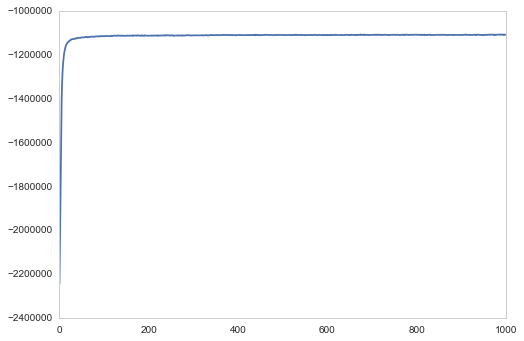

In [5]:
plt.plot(lda.log_likelihoods)

Save the LDA results for analysis later

In [7]:
lda.save_project('results/beer_analysis.project', 'Initial analysis of all 4 beer runs by Joe')

Project saved to results/beer_analysis.project time taken = 11.3364708424


<h1>1b. Load existing LDA results</h1>

Load the LDA results above

In [2]:
lda = MultifileLDA.resume_from('results/beer_analysis.project')
print lda.last_saved_timestamp, lda.message

Project loaded from results/beer_analysis.project time taken = 13.5203230381
Tue Apr 12 10:18:21 2016 Initial analysis of all 4 beer runs by Joe


Here we set some arbitrary threshold values on these document-to-topic and topic-to-word distributions.

In [3]:
lda.do_thresholding(th_doc_topic=0.05, th_topic_word=0.01)

Print the top words in each topic above the threshold values set before.

In [4]:
_ = lda.get_top_words()

Mass2Motif 0: loss_180.05853 (0.473), fragment_85.02834 (0.093), fragment_69.03369 (0.070), fragment_97.0284 (0.012), fragment_81.03339 (0.011),

Mass2Motif 1: fragment_126.09168 (0.223), fragment_218.10315 (0.047), fragment_172.09764 (0.041), fragment_200.0915 (0.032), fragment_154.08586 (0.028), fragment_252.1239 (0.021), fragment_231.1466 (0.018), fragment_83.07297 (0.013),

Mass2Motif 2: fragment_180.10145 (0.273), fragment_162.09144 (0.090), fragment_134.09677 (0.069), fragment_851.26899 (0.030), fragment_133.05127 (0.020), fragment_136.07597 (0.018), fragment_208.09799 (0.017), fragment_197.12838 (0.012), fragment_226.10733 (0.011), fragment_138.09146 (0.011), fragment_161.10738 (0.010),

Mass2Motif 3: fragment_68.99724 (0.209), fragment_129.01857 (0.090), fragment_157.01326 (0.037), fragment_139.00252 (0.037), fragment_111.00763 (0.034), fragment_269.04088 (0.022), fragment_176.99219 (0.021), fragment_185.08133 (0.014),

Mass2Motif 4: fragment_239.1132 (0.038), fragment_197.1176

<h1>2. Results</h1>

Create a plotting object

In [5]:
plotter = MultifileLDAViz(lda)
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

<h2>a. Ferulic Acid</h2>

From our previous results with running LDA independently for each file, we have identified the following words to be characteristic of the Ferulic acid topics:

|Word|
|----|
|fragment_177.0547|
|fragment_145.0284|
|fragment_89.0386|
|fragment_117.0331|
|fragment_149.0599|

By manual inspection, topic 229 in the multi-file LDA results seems to correspond to the set of words above.

In [6]:
k = 229

Plot how many documents can be explained by this topic (degree) in each file above the set threshold. We expect similar numbers to the table below, obtained from running LDA independently on each file from before:

|File|Degree|
|--|--------|
|Beer1|11|
|Beer2|11|
|Beer3|11|
|Beer4|10|

,file,M2M,degree
0,0,229,11
1,1,229,10
2,2,229,12
3,3,229,8


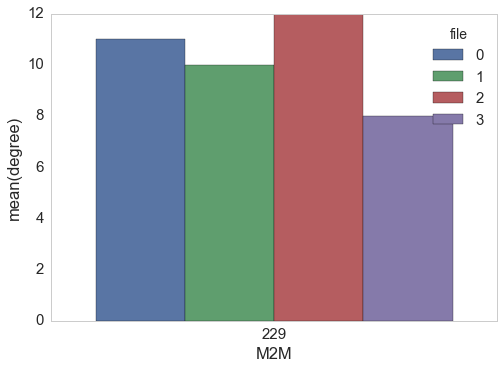

In [9]:
plotter.plot_motif_degrees([k])

Additionally, we can also plot the probabilities of seeing this topic across multiple files.

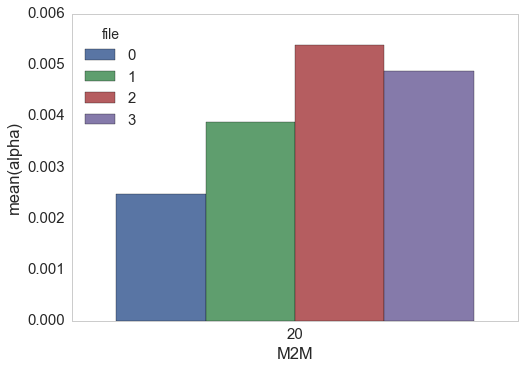

In [28]:
_ = plotter.plot_e_alphas([k])

Plot of all the documents across the 4 collections that can be explained by this topic.

Mass2Motif 229: fragment_177.05486 (0.155), fragment_89.03865 (0.124), fragment_145.02987 (0.121), fragment_117.03323 (0.092), fragment_307.17544 (0.043), fragment_307.09835 (0.032), fragment_289.14177 (0.013), fragment_149.05985 (0.013), fragment_114.1028 (0.012),



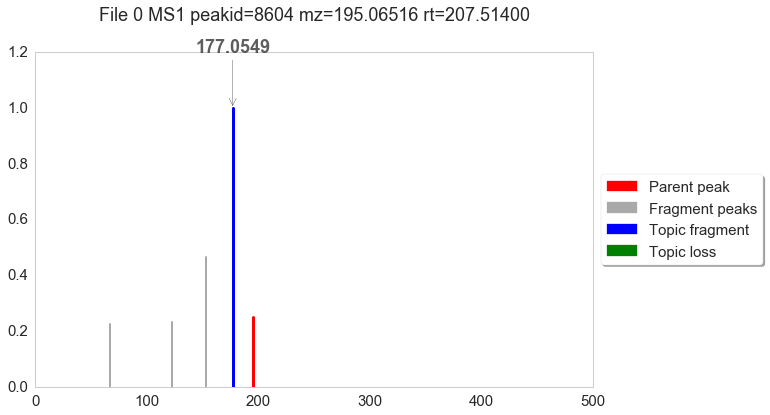

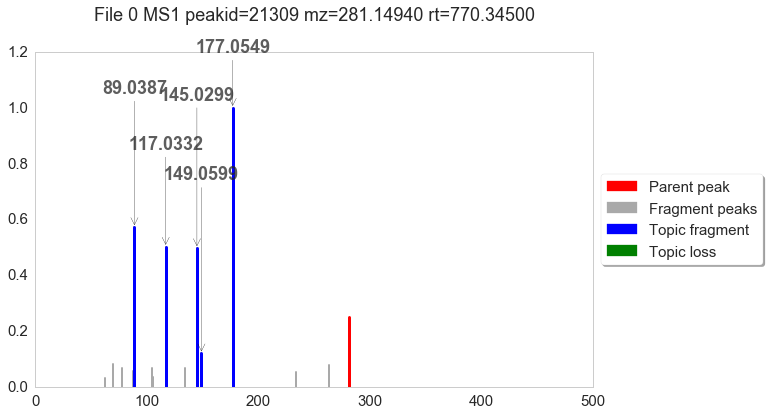

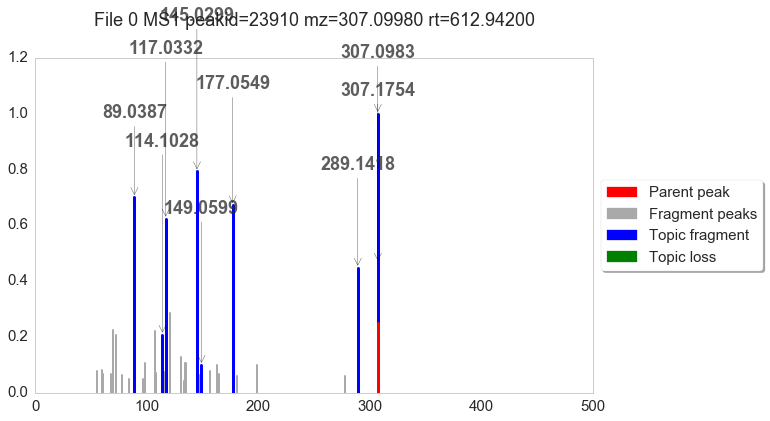

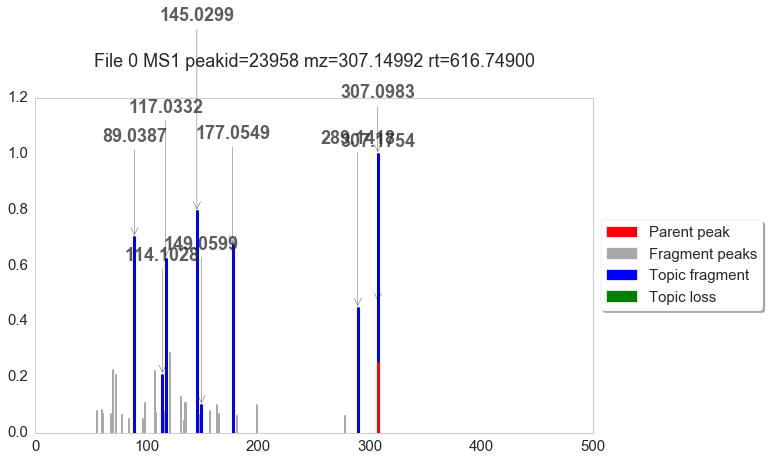

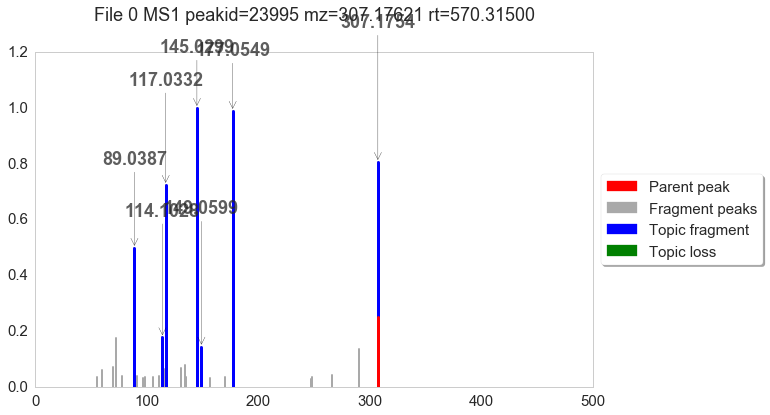

...

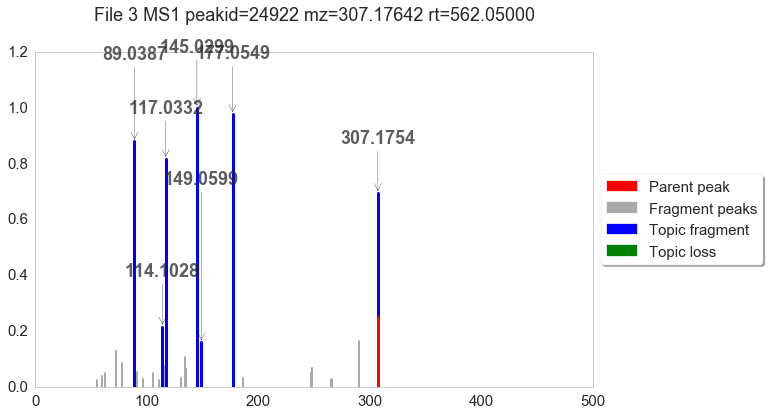

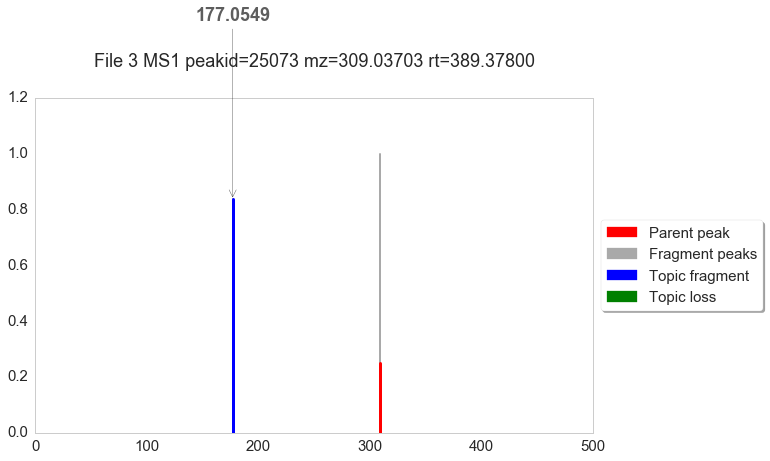

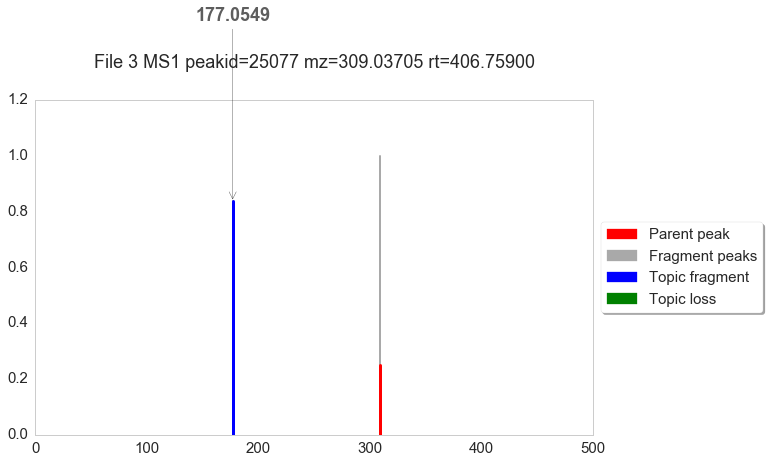

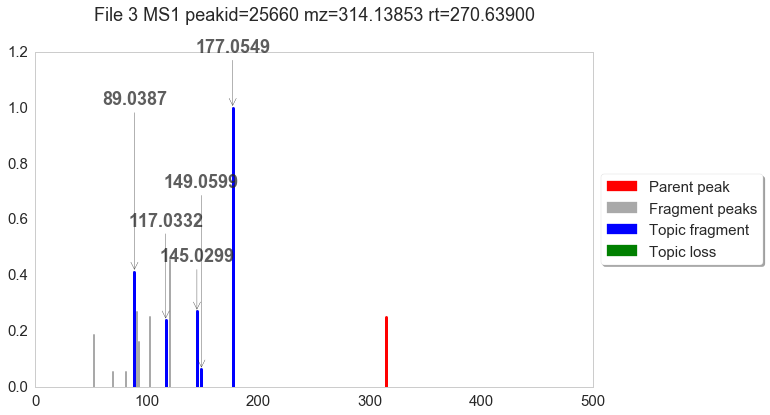

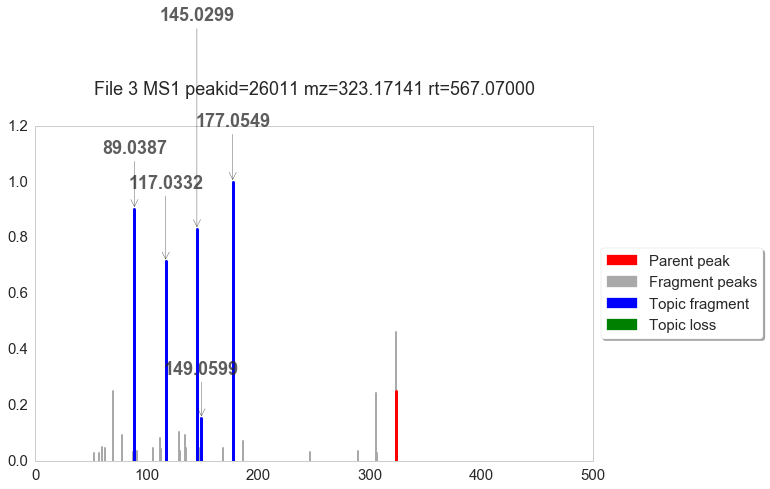

In [10]:
plotter.plot_docs(k)

<h2>b. Histidine</h2>

Previous histidine topics consists of:

|Word|
|----|
|fragment_110.0718|
|fragment_156.0769|
|fragment_93.0450|
|fragment_95.0608|

Previous degrees:

|File|Degree|
|--|-----|
|Beer1|19|
|Beer2|27|
|Beer3|21|
|Beer4|25|

In [12]:
k = 237

,file,M2M,degree
0,0,237,18
1,1,237,26
2,2,237,19
3,3,237,18


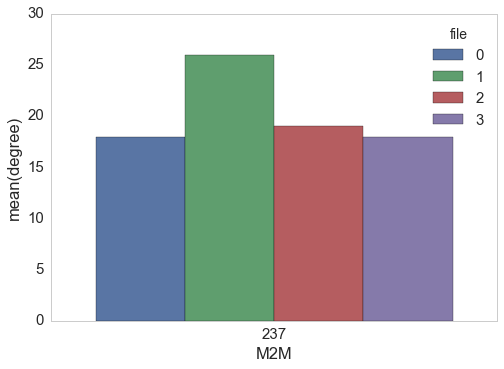

In [15]:
plotter.plot_motif_degrees([k])

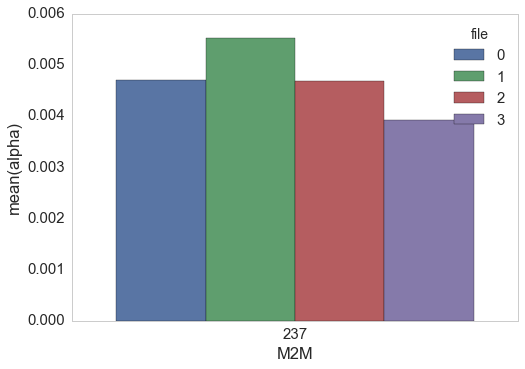

In [14]:
_ = plotter.plot_e_alphas([k])

Mass2Motif 237: fragment_110.07161 (0.337), fragment_83.06041 (0.067), fragment_156.07853 (0.059), fragment_82.05246 (0.044), fragment_93.04511 (0.042), fragment_209.10558 (0.028), fragment_81.04494 (0.021), fragment_251.15068 (0.018), loss_73.01615 (0.015),



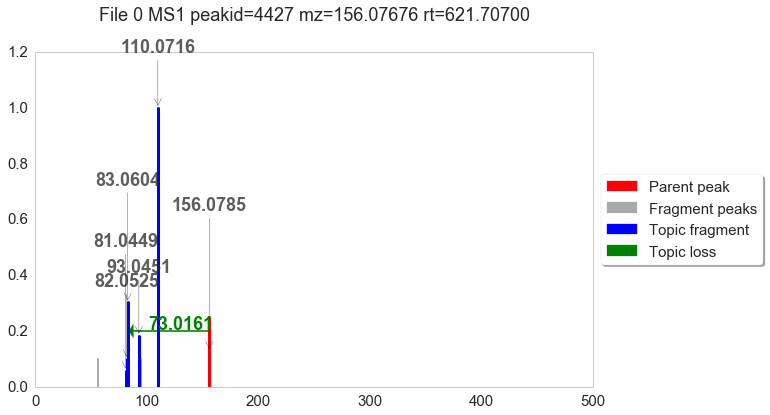

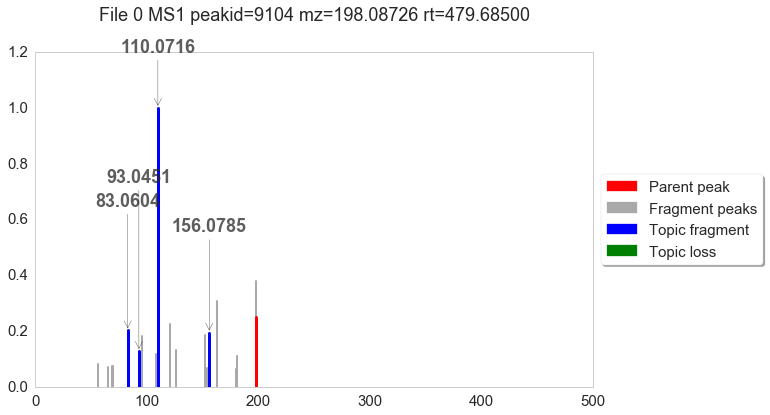

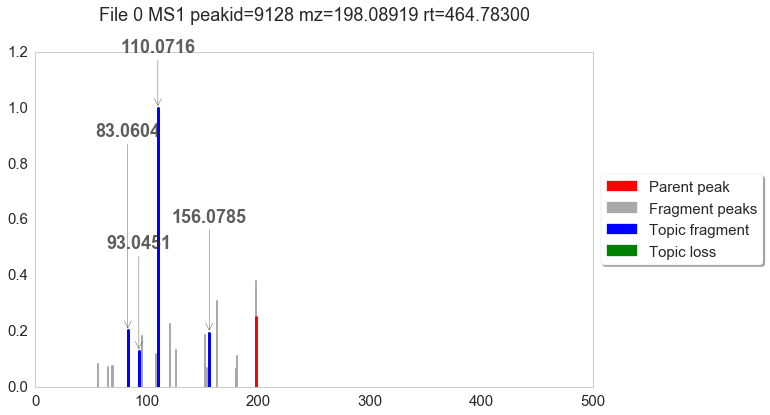

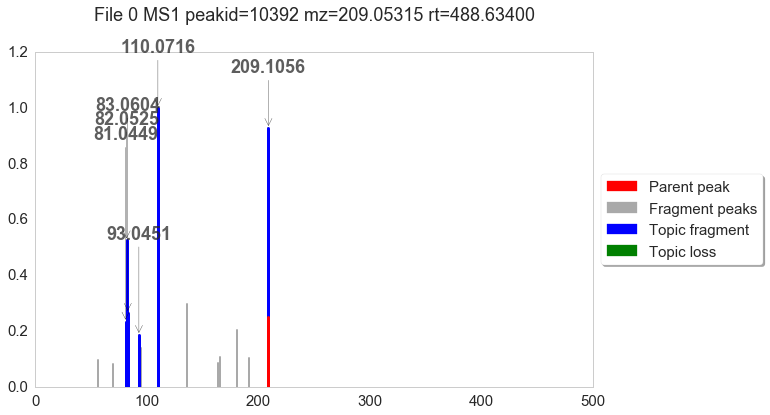

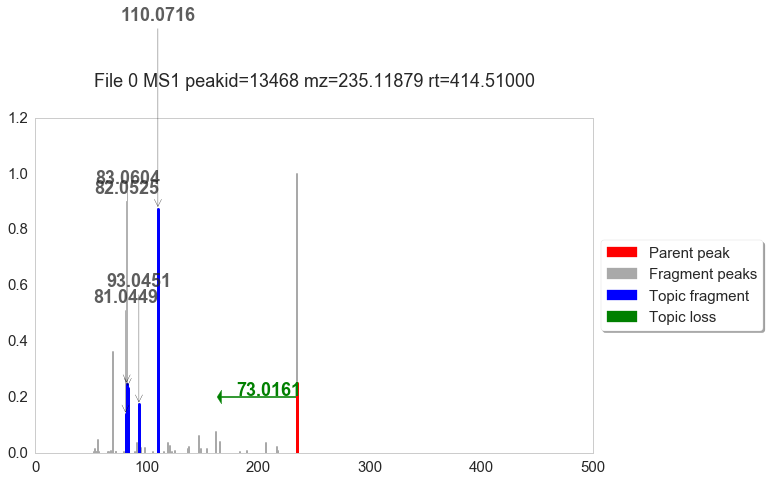

...

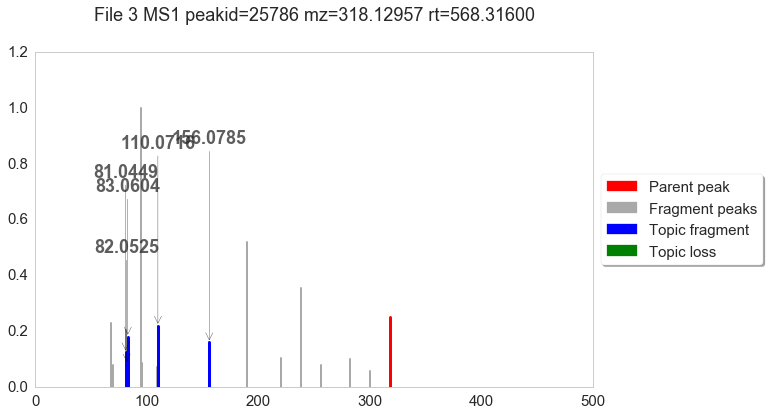

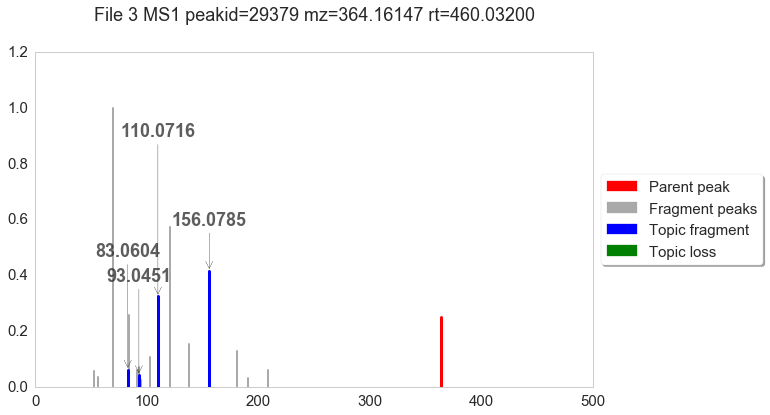

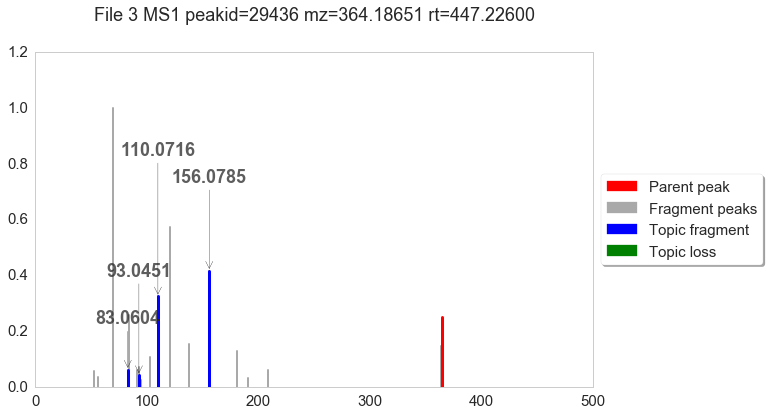

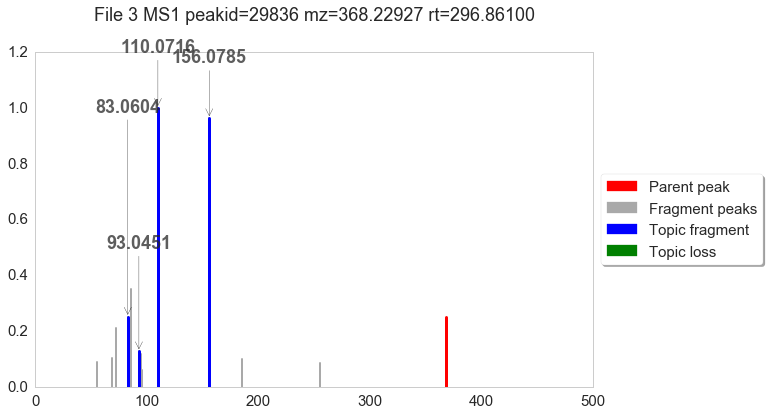

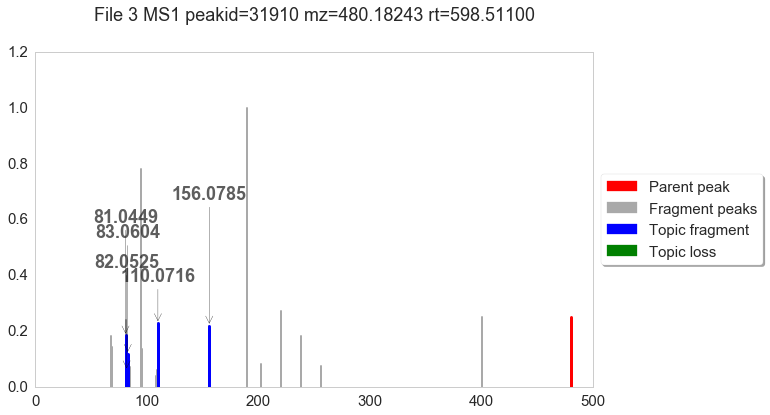

In [13]:
plotter.plot_docs(k)

<h2>c. Leucine</h2>

Previous Leucine topics consists of:

|Word|
|----|
|fragment_86.0965|
|fragment_132.1015|

Previous degrees:

|File|Degree|
|--|-------------------------------|
|Beer1|61|
|Beer2|101|
|Beer3|66|
|Beer4|38|

,file,M2M,degree
0,0,91,28
1,1,91,69
2,2,91,45
3,3,91,29


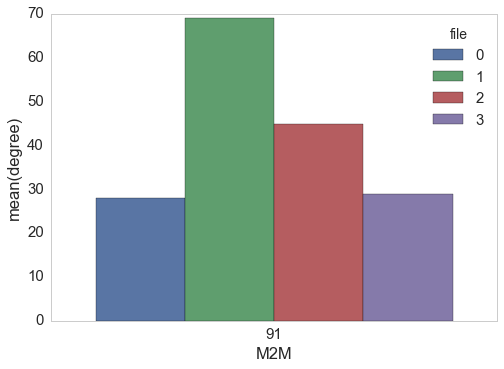

In [21]:
plotter.plot_motif_degrees([k])

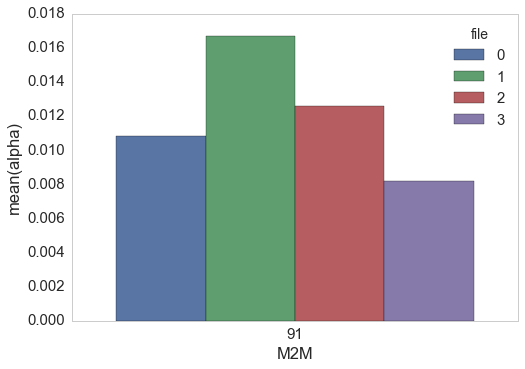

In [20]:
_ = plotter.plot_e_alphas([k])

Mass2Motif 91: fragment_86.09653 (0.660), fragment_132.10165 (0.049), fragment_69.07013 (0.026), fragment_143.11771 (0.010),



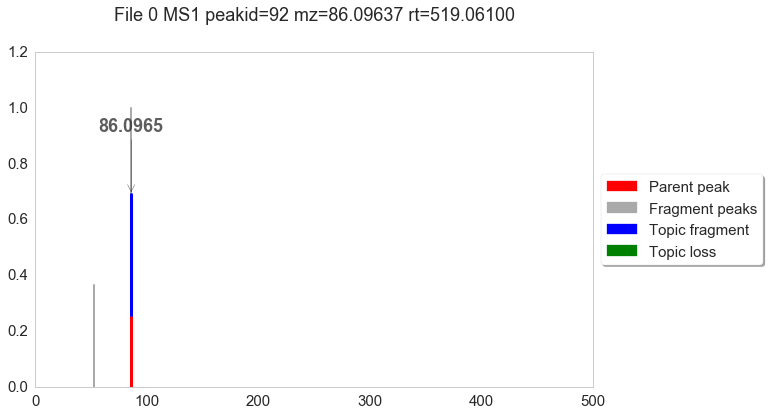

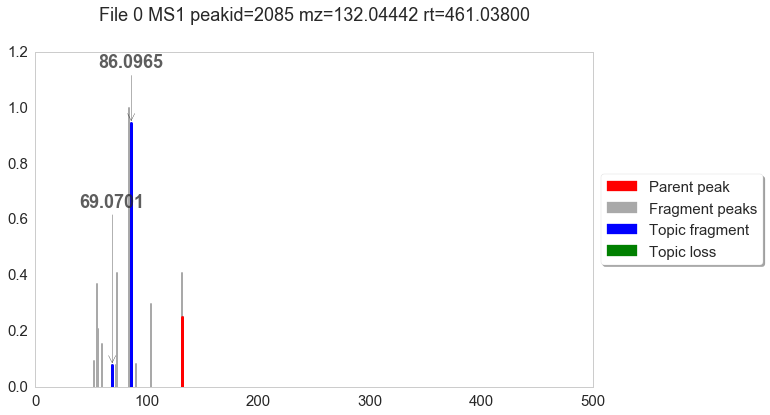

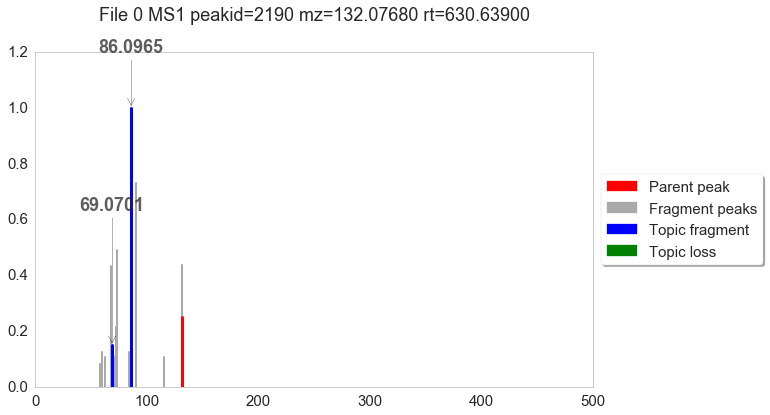

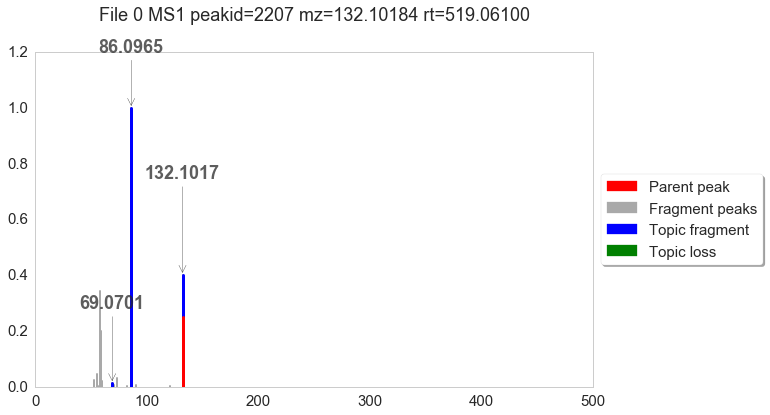

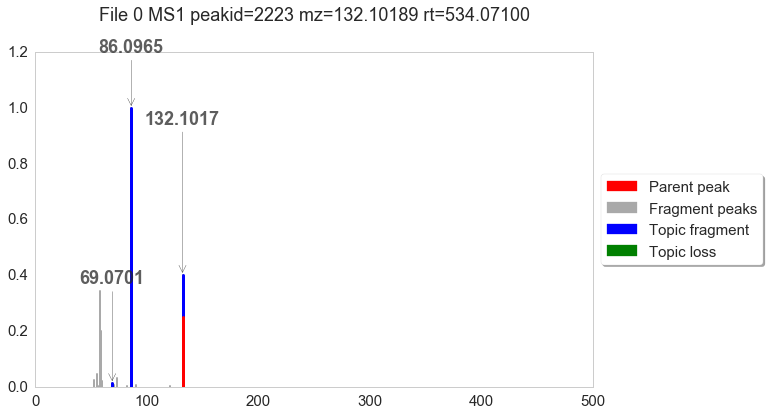

...

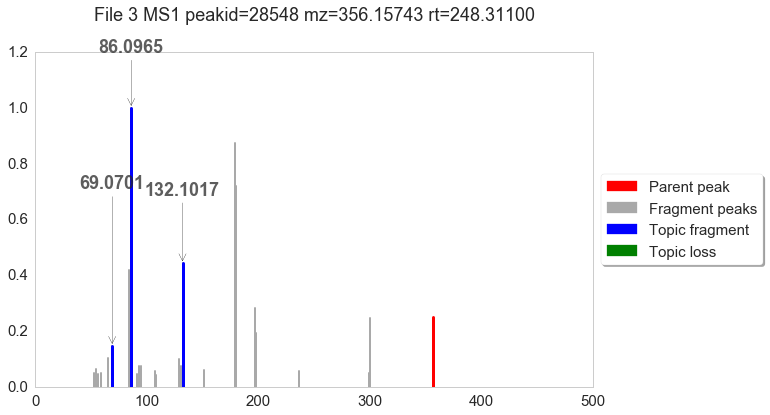

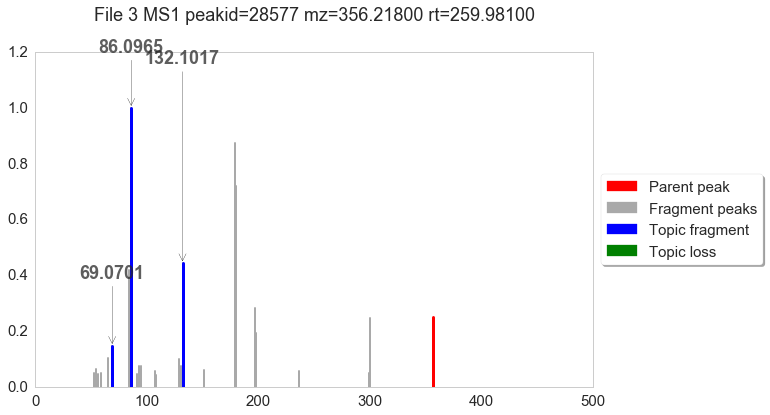

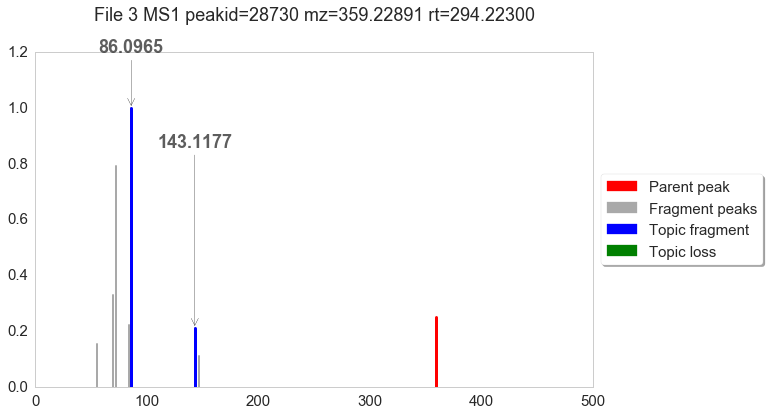

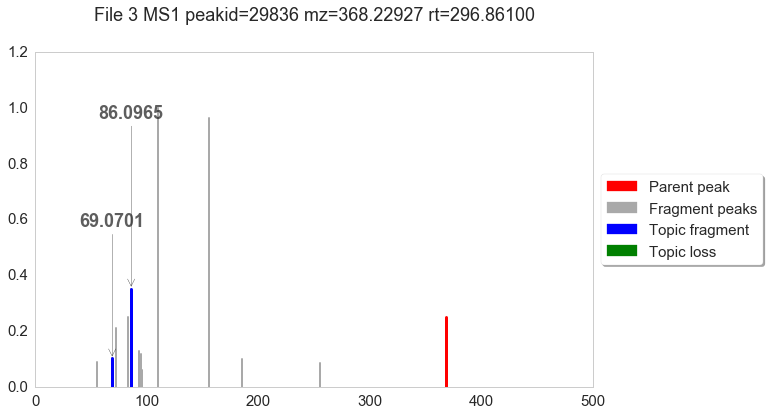

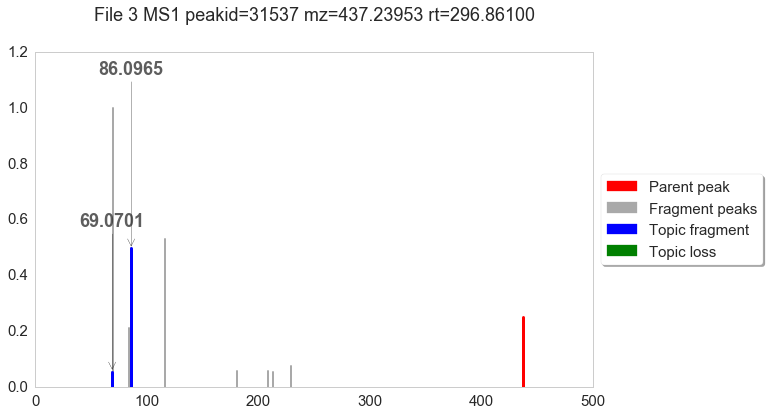

In [19]:
k = 91
plotter.plot_docs(k)

<h2>d. Asparagine</h2>

Previous Asparagine topics consists of:

|Word|
|----|
|fragment_74.0235|
|fragment_88.0392|
|fragment_70.0290|
|fragment_87.0554|
|fragment_133.0615|
|fragment_116.0344|

Previous degrees (prevalent in Beer3):

|File|Degree|
|--|-------------------------------|
|Beer1|6|
|Beer2|9|
|Beer3|17|
|Beer4|-|

,file,M2M,degree
0,0,175,7
1,1,175,5
2,2,175,12
3,3,175,3


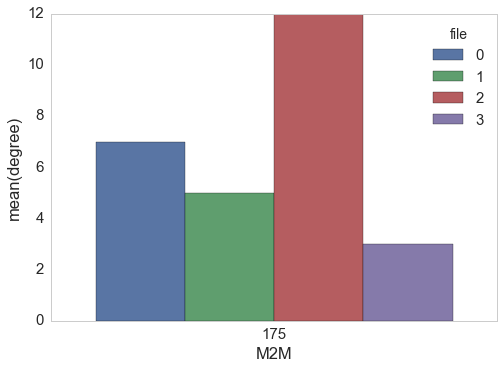

In [24]:
plotter.plot_motif_degrees([k])

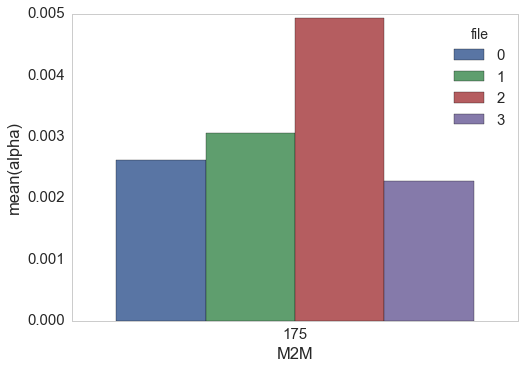

In [23]:
_ = plotter.plot_e_alphas([k])

Mass2Motif 175: fragment_88.03921 (0.139), fragment_74.02356 (0.130), fragment_87.05544 (0.033), fragment_102.05482 (0.031), loss_45.02135 (0.030), fragment_133.06337 (0.023), fragment_158.04474 (0.015), fragment_70.02897 (0.011),



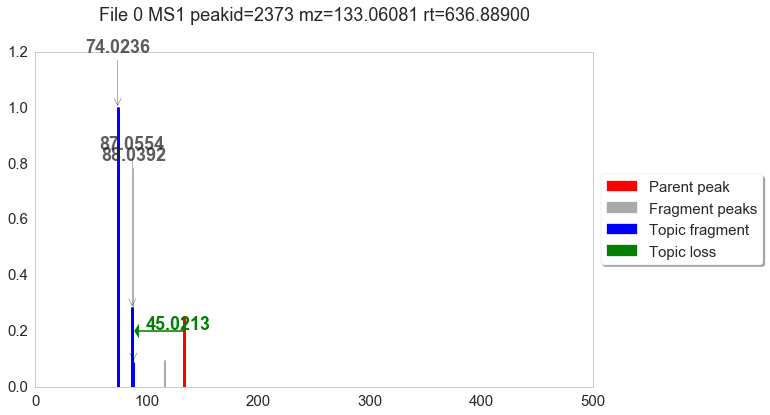

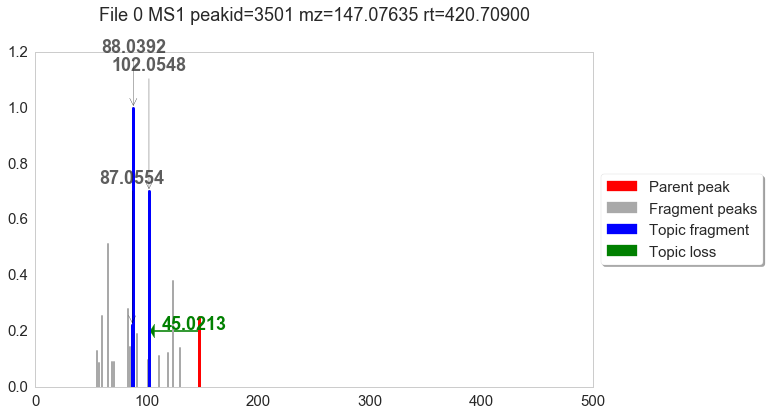

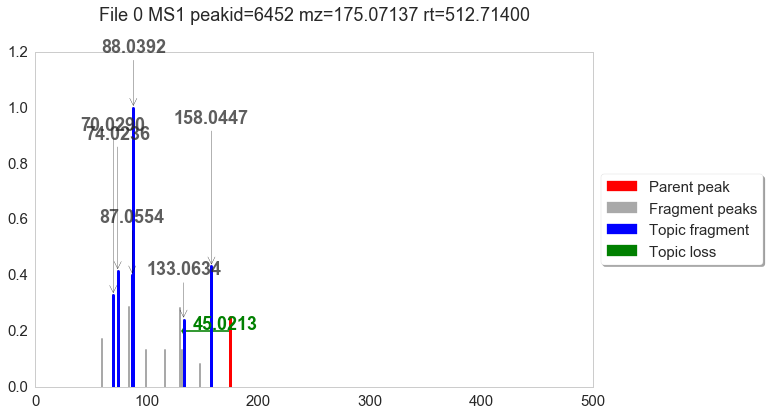

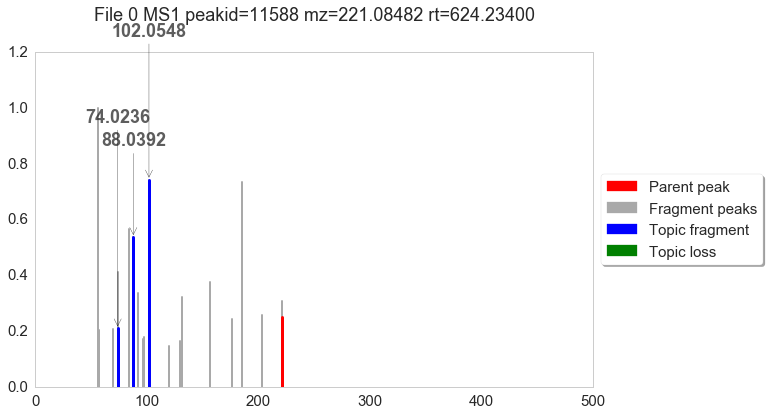

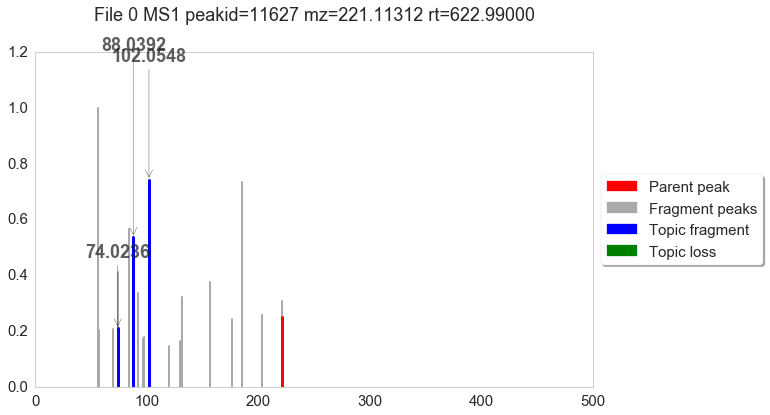

...

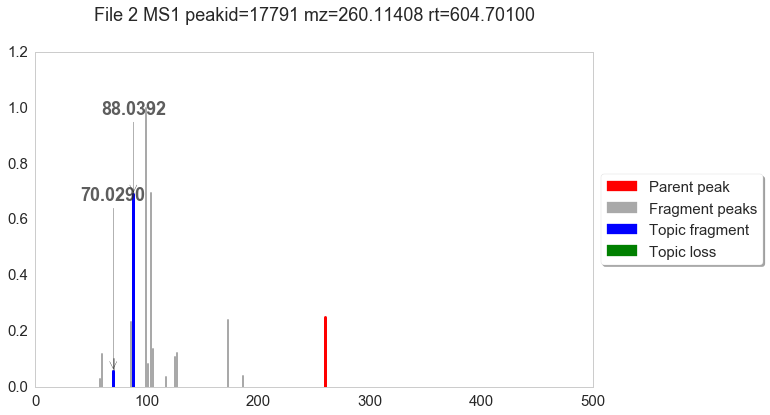

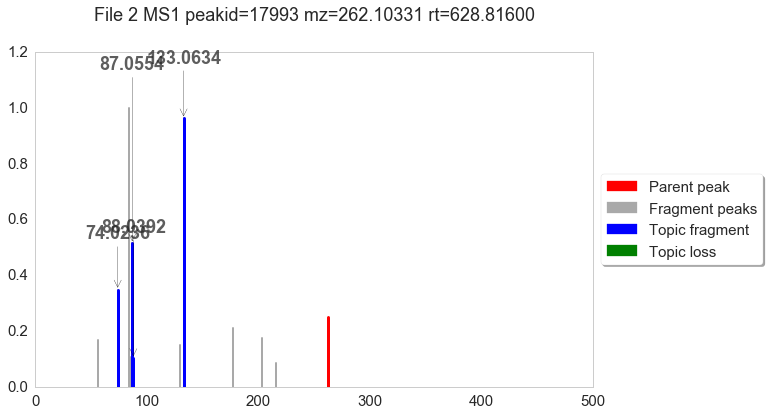

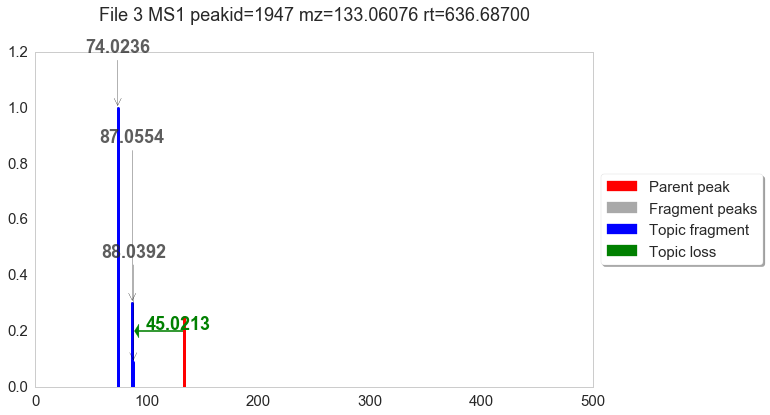

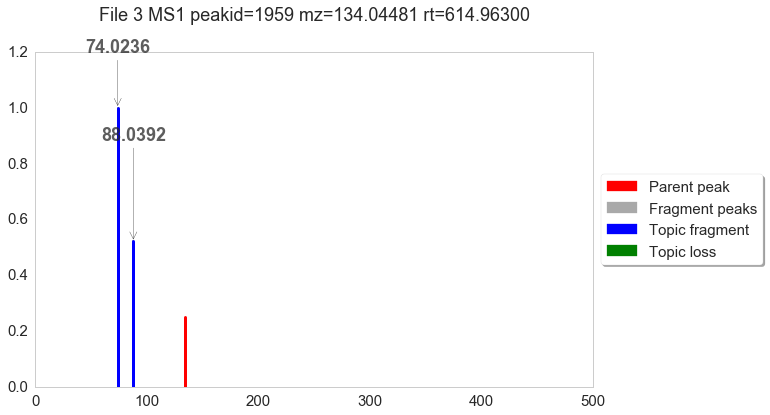

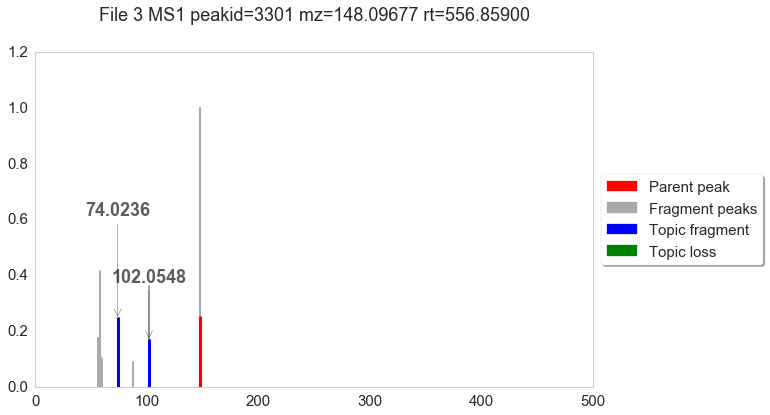

In [22]:
k = 175
plotter.plot_docs(k)

<h2>e. Asparagine</h2>

Previous Adenine topics consist of:

|Word|
|----|
|fragment_136.0629|
|fragment_119.0351|

Previous degrees (prevalent in Beer3)

|File|Degree|
|--|-------------------------------|
|Beer1|15|
|Beer2|23|
|Beer3|32|
|Beer4|19|

,file,M2M,degree
0,0,20,11
1,1,20,20
2,2,20,33
3,3,20,22


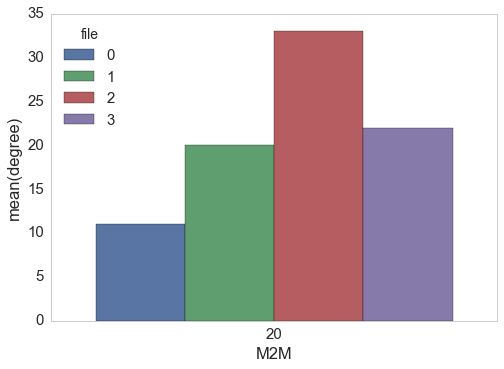

In [27]:
plotter.plot_motif_degrees([k])

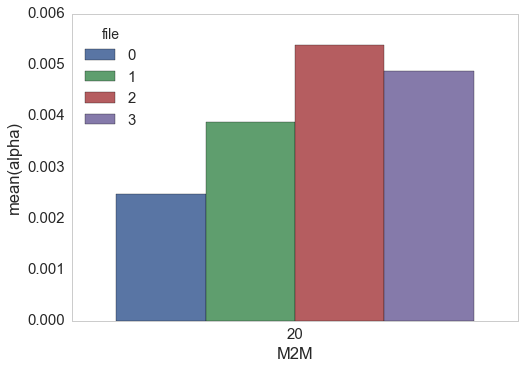

In [26]:
_ = plotter.plot_e_alphas([k])

Mass2Motif 20: fragment_136.06231 (0.502), fragment_137.06648 (0.077), fragment_119.0354 (0.010),



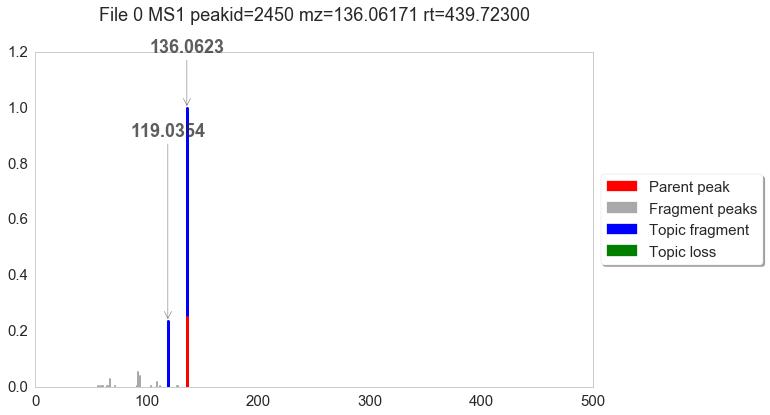

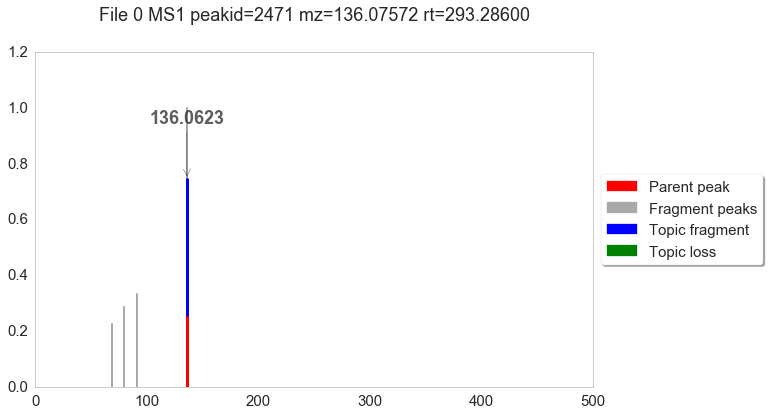

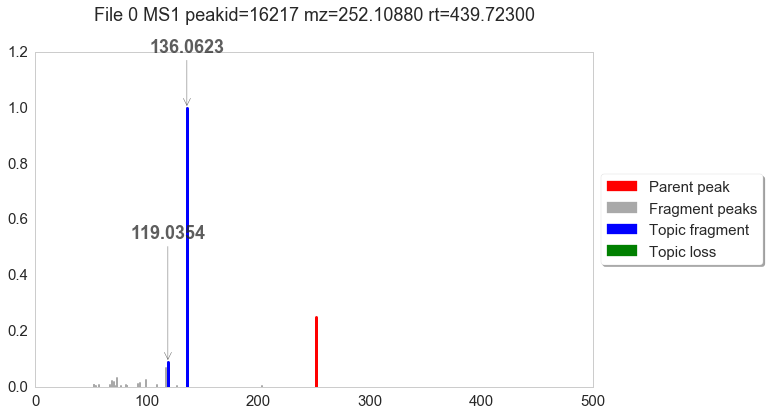

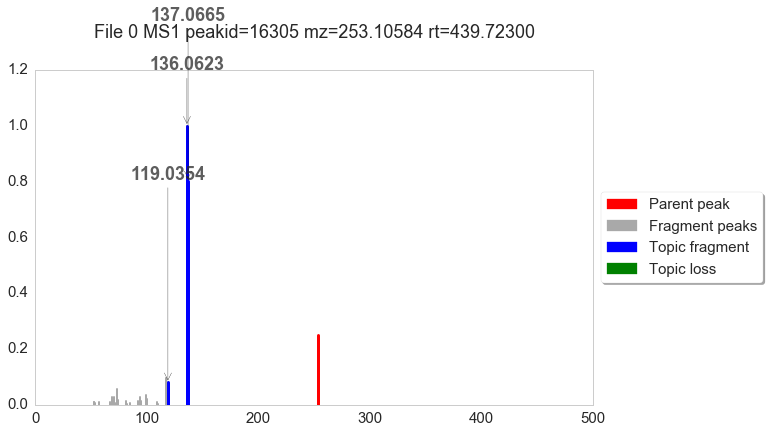

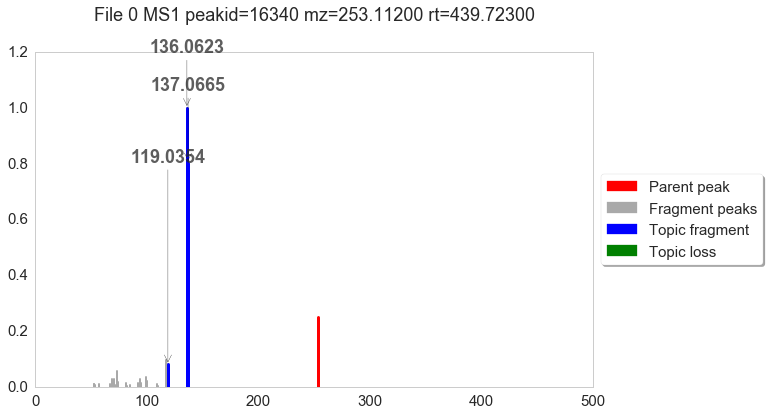

...

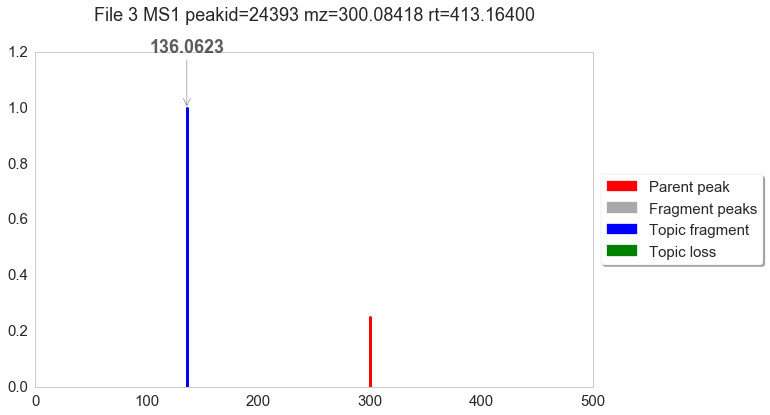

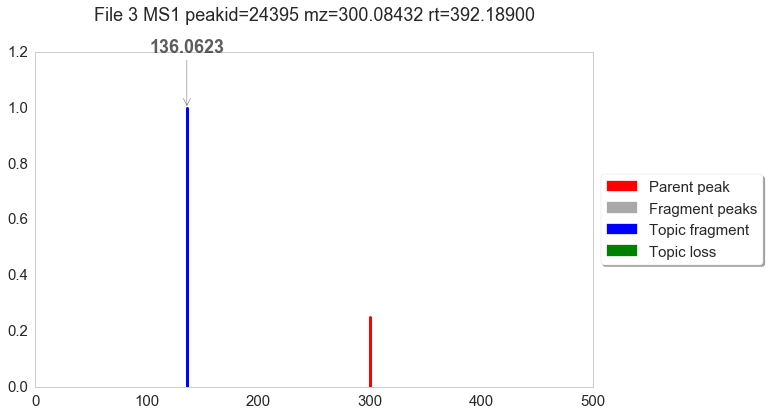

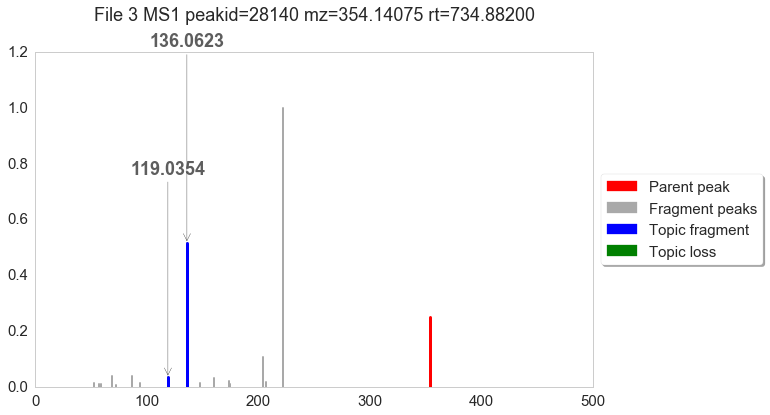

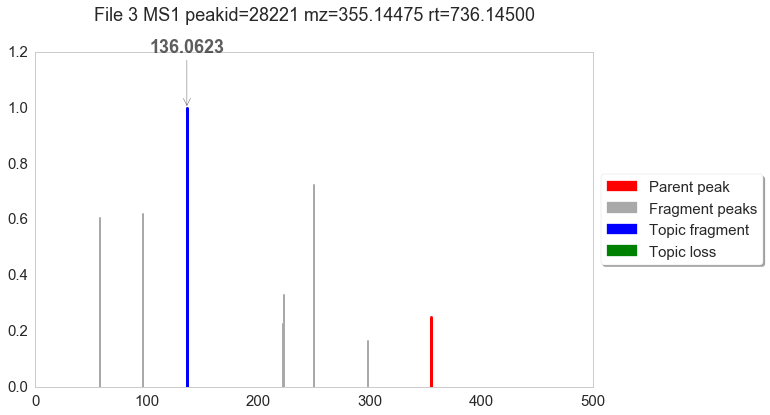

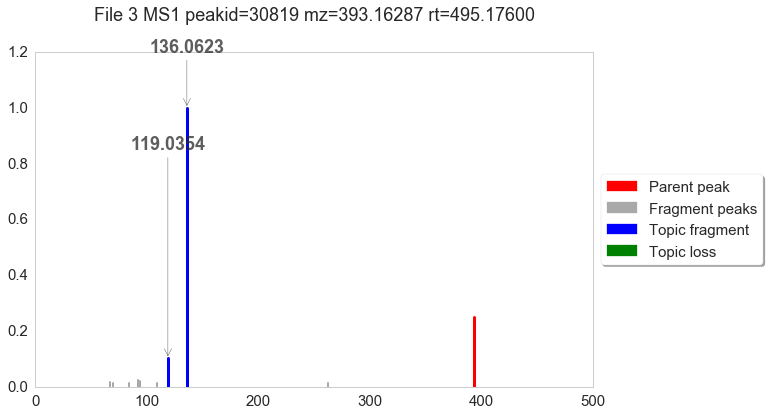

In [25]:
k = 20
plotter.plot_docs(k)

<h1>3. TODO</h1>

- Faster Gibbs sampling (it takes hours to run now).
- Reduce memory usage. Use sparse matrices / dictionaries to store the probabilities.
- When saving the results, we should only save the data that we need, instead of dumping the whole LDA object out -- which will break when we change the LDA object in the future.
- Interactive visualisation of the results, either as standalone or in PiMP/Frank.
- Differential analysis, i.e. PLAGE.
- Query topics and spectra against NIST/MassBank for quick annotation & identification.